<a href="https://colab.research.google.com/github/Mohamed-Maher5/Deep-Learning/blob/main/CNN%20Project/CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Link Kaggle Dataset**

In [1]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mohamedmaher5","key":"91a688556b6a9fab04173a86be148128"}'}

In [2]:
! mkdir ~/.kaggle

In [3]:
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [4]:
! kaggle datasets download misrakahmed/vegetable-image-dataset

100% 533M/534M [00:24<00:00, 22.6MB/s]
100% 534M/534M [00:24<00:00, 22.8MB/s]


In [5]:
! unzip vegetable-image-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Vegetable Images/train/Radish/0001.jpg  
  inflating: Vegetable Images/train/Radish/0002.jpg  
  inflating: Vegetable Images/train/Radish/0003.jpg  
  inflating: Vegetable Images/train/Radish/0004.jpg  
  inflating: Vegetable Images/train/Radish/0005.jpg  
  inflating: Vegetable Images/train/Radish/0006.jpg  
  inflating: Vegetable Images/train/Radish/0007.jpg  
  inflating: Vegetable Images/train/Radish/0008.jpg  
  inflating: Vegetable Images/train/Radish/0009.jpg  
  inflating: Vegetable Images/train/Radish/0010.jpg  
  inflating: Vegetable Images/train/Radish/0011.jpg  
  inflating: Vegetable Images/train/Radish/0012.jpg  
  inflating: Vegetable Images/train/Radish/0013.jpg  
  inflating: Vegetable Images/train/Radish/0014.jpg  
  inflating: Vegetable Images/train/Radish/0015.jpg  
  inflating: Vegetable Images/train/Radish/0016.jpg  
  inflating: Vegetable Images/train/Radish/0017.jpg  
  inflating: Vegetable Images/t

In [6]:
train_path = r'/content/Vegetable Images/train'
test_path = r'/content/Vegetable Images/test'
val_path = r'/content/Vegetable Images/validation'

**Import Libraries**

In [59]:
## Main Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
import tensorflow as tf
import keras
import os
import glob as gb

## Preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Model Selection
from sklearn.model_selection import train_test_split

## Metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve

## Call drive
from google.colab import drive

## Models
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout
from keras.layers import Dense, BatchNormalization


**Link Classes to indexs**

In [60]:
## Labeling
code = {'Bean' : 0, 'Bitter_Gourd' :1 , 'Bottle_Gourd' : 2, 'Brinjal' : 3, 'Broccoli' : 4,'Cabbage' : 5, 'Capsicum' : 6, 'Carrot' : 7,  'Cauliflower' : 8, 'Cucumber' : 9,  'Papaya' : 10,  'Potato' :11,  'Pumpkin' :12, 'Radish' :13, 'Tomato' : 14}

def getCode(n) :
  for x , y in code.items() :
    if n == y :
      return x

**Preparing & Preprocessing Dataset**

In [61]:
for folder in os.listdir(train_path) :
  files = gb.glob(pathname=str(train_path+"//"+folder+"/*.jpg"))
  print(f'For traingi data , found {len(files)} in folder {folder}')

For traingi data , found 1000 in folder Cucumber
For traingi data , found 1000 in folder Cauliflower
For traingi data , found 1000 in folder Cabbage
For traingi data , found 1000 in folder Radish
For traingi data , found 1000 in folder Bean
For traingi data , found 1000 in folder Bitter_Gourd
For traingi data , found 1000 in folder Capsicum
For traingi data , found 1000 in folder Tomato
For traingi data , found 1000 in folder Carrot
For traingi data , found 1000 in folder Potato
For traingi data , found 1000 in folder Bottle_Gourd
For traingi data , found 1000 in folder Broccoli
For traingi data , found 1000 in folder Pumpkin
For traingi data , found 1000 in folder Papaya
For traingi data , found 1000 in folder Brinjal


In [10]:
for folder in os.listdir(test_path) :
  files = gb.glob(pathname=str(test_path+"//"+folder+"/*.jpg"))
  print(f'For traingi data , found {len(files)} in folder {folder}')

For traingi data , found 200 in folder Cucumber
For traingi data , found 200 in folder Cauliflower
For traingi data , found 200 in folder Cabbage
For traingi data , found 200 in folder Radish
For traingi data , found 200 in folder Bean
For traingi data , found 200 in folder Bitter_Gourd
For traingi data , found 200 in folder Capsicum
For traingi data , found 200 in folder Tomato
For traingi data , found 200 in folder Carrot
For traingi data , found 200 in folder Potato
For traingi data , found 200 in folder Bottle_Gourd
For traingi data , found 200 in folder Broccoli
For traingi data , found 200 in folder Pumpkin
For traingi data , found 200 in folder Papaya
For traingi data , found 200 in folder Brinjal


In [11]:
for folder in os.listdir(val_path) :
  files = gb.glob(pathname=str(val_path+"//"+folder+"/*.jpg"))
  print(f'For traingi data , found {len(files)} in folder {folder}')

For traingi data , found 200 in folder Cucumber
For traingi data , found 200 in folder Cauliflower
For traingi data , found 200 in folder Cabbage
For traingi data , found 200 in folder Radish
For traingi data , found 200 in folder Bean
For traingi data , found 200 in folder Bitter_Gourd
For traingi data , found 200 in folder Capsicum
For traingi data , found 200 in folder Tomato
For traingi data , found 200 in folder Carrot
For traingi data , found 200 in folder Potato
For traingi data , found 200 in folder Bottle_Gourd
For traingi data , found 200 in folder Broccoli
For traingi data , found 200 in folder Pumpkin
For traingi data , found 200 in folder Papaya
For traingi data , found 200 in folder Brinjal


In [12]:
train_size = []
for folder in os.listdir(train_path) :
  files = gb.glob(pathname=str(train_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    train_size.append(image.shape)
pd.Series(train_size).value_counts()

(224, 224, 3)    14994
(193, 224, 3)        1
(205, 224, 3)        1
(200, 224, 3)        1
(210, 224, 3)        1
(211, 224, 3)        1
(198, 224, 3)        1
dtype: int64

In [13]:
test_size = []
for folder in os.listdir(test_path) :
  files = gb.glob(pathname=str(test_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    test_size.append(image.shape)
pd.Series(test_size).value_counts()

(224, 224, 3)    2999
(207, 224, 3)       1
dtype: int64

In [14]:
val_size = []
for folder in os.listdir(val_path) :
  files = gb.glob(pathname=str(val_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    val_size.append(image.shape)
pd.Series(val_size).value_counts()

(224, 224, 3)    2998
(187, 224, 3)       1
(223, 224, 3)       1
dtype: int64

In [15]:
size = 150

In [16]:
X_train = []
y_train = []
for folder in os.listdir(train_path) :
  files = gb.glob(pathname=str(train_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    image_array = cv2.resize(image , (size,size))
    X_train.append(list(image_array))
    y_train.append(code[folder])

In [17]:
print(f'we have {len(X_train)} items in X_train_dataset')
print(f'we have {len(y_train)} items in y_train_dataset')

we have 15000 items in X_train_dataset
we have 15000 items in y_train_dataset


In [22]:
X_val = []
y_val = []
for folder in os.listdir(val_path) :
  files = gb.glob(pathname=str(val_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    image_array = cv2.resize(image , (size,size))
    X_val.append(list(image_array))
    y_val.append(code[folder])

In [23]:
print(f'we have {len(X_val)} items in X_val')
print(f'we have {len(y_val)} items in y_val')

we have 3000 items in X_val
we have 3000 items in y_val


In [19]:
X_test = []
y_test = []
for folder in os.listdir(test_path) :
  files = gb.glob(pathname=str(test_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    image_array = cv2.resize(image , (size,size))
    X_test.append(list(image_array))
    y_test.append(code[folder])

In [20]:
print(f'we have {len(X_test)} items in X_test_dataset')
print(f'we have {len(y_test)} items in y_test_dataset')

we have 3000 items in X_test_dataset
we have 3000 items in y_test_dataset


**Exploratory Data Analysis (EDA)**

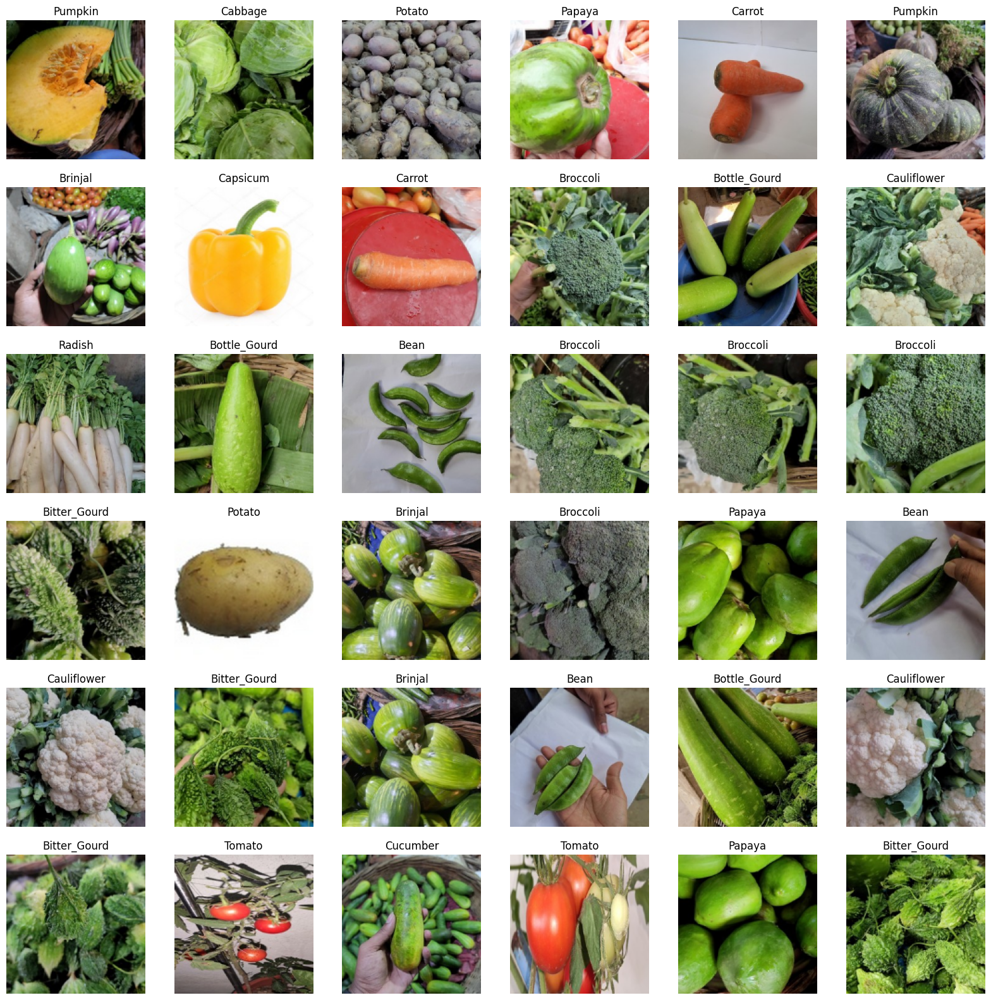

In [18]:
import numpy as np
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_train[i])
  plt.axis('off')
  plt.title(getCode(y_train[i]))

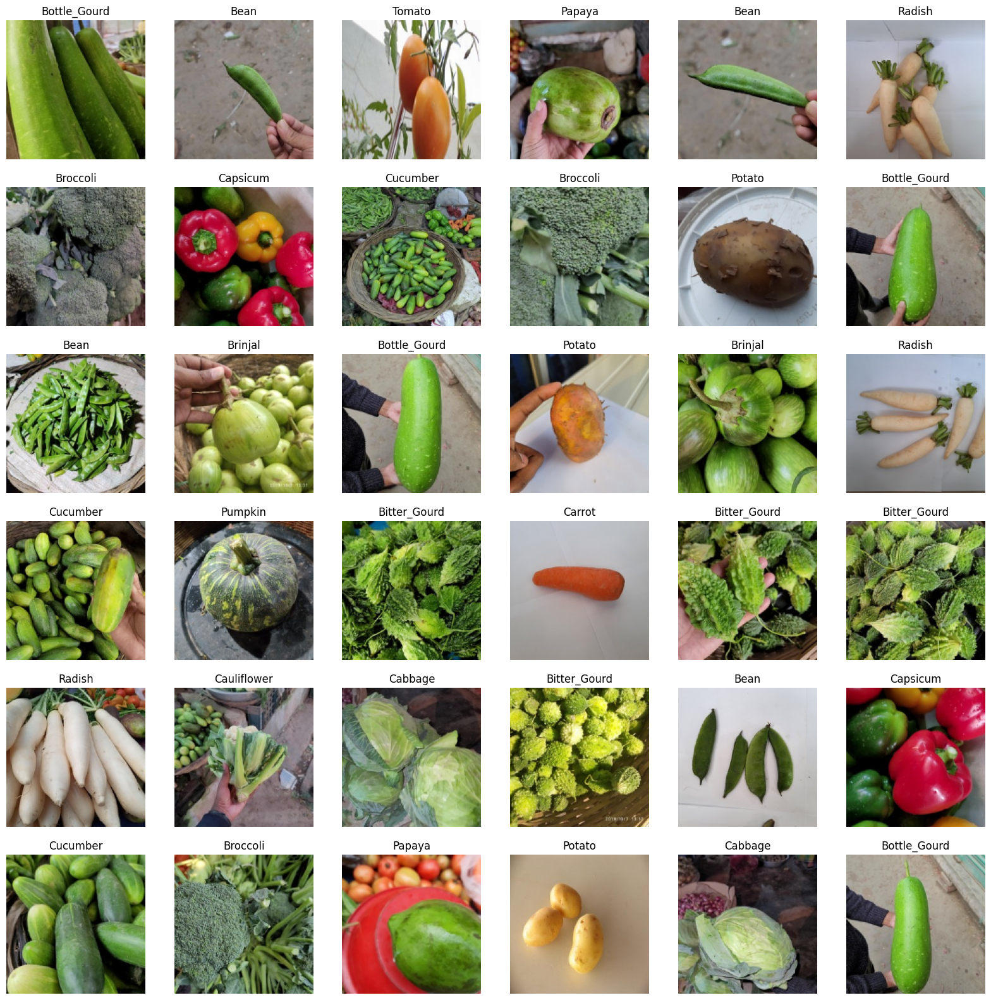

In [21]:
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_test[i])
  plt.axis('off')
  plt.title(getCode(y_test[i]))

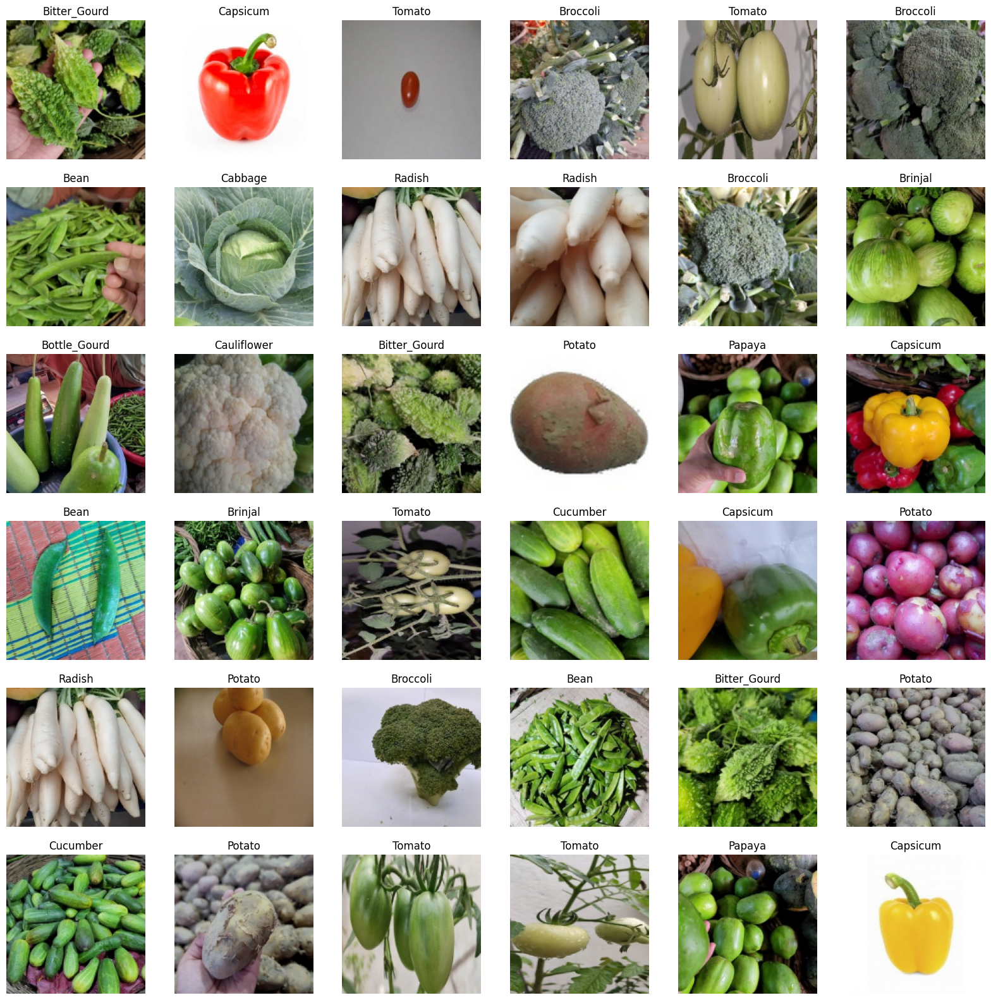

In [24]:
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_val) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_val[i])
  plt.axis('off')
  plt.title(getCode(y_val[i]))

In [62]:
## Convert the Data to Array to work in the Model
X_train= np.array(X_train)
y_train = np.array(y_train)

X_test = np.array(X_test)
y_test = np.array(y_test)

X_val = np.array(X_val)
y_val = np.array(y_val)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {y_train.shape}')
print(f'y_train shape  is {X_test.shape}')
print(f'y_test shape  is {y_test.shape}')
print(f'y_test shape  is {X_val.shape}')
print(f'y_test shape  is {y_val.shape}')

X_train shape  is (15000, 150, 150, 3)
X_test shape  is (15000,)
y_train shape  is (3000, 150, 150, 3)
y_test shape  is (3000,)
y_test shape  is (3000, 150, 150, 3)
y_test shape  is (3000,)


**Building the Model**

In [26]:
model = Sequential()

input_shape = (size, size, 3)

model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=input_shape))
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))

model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(15, activation='softmax'))

## Summary about the Model
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 146, 146, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 142, 142, 32)      25632     
                                                                 
 batch_normalization (Batch  (None, 142, 142, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 71, 71, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 71, 71, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 69, 69, 64)        1

In [50]:
!pip install visualkeras
import visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 11.5 MB/s eta 0:00:00


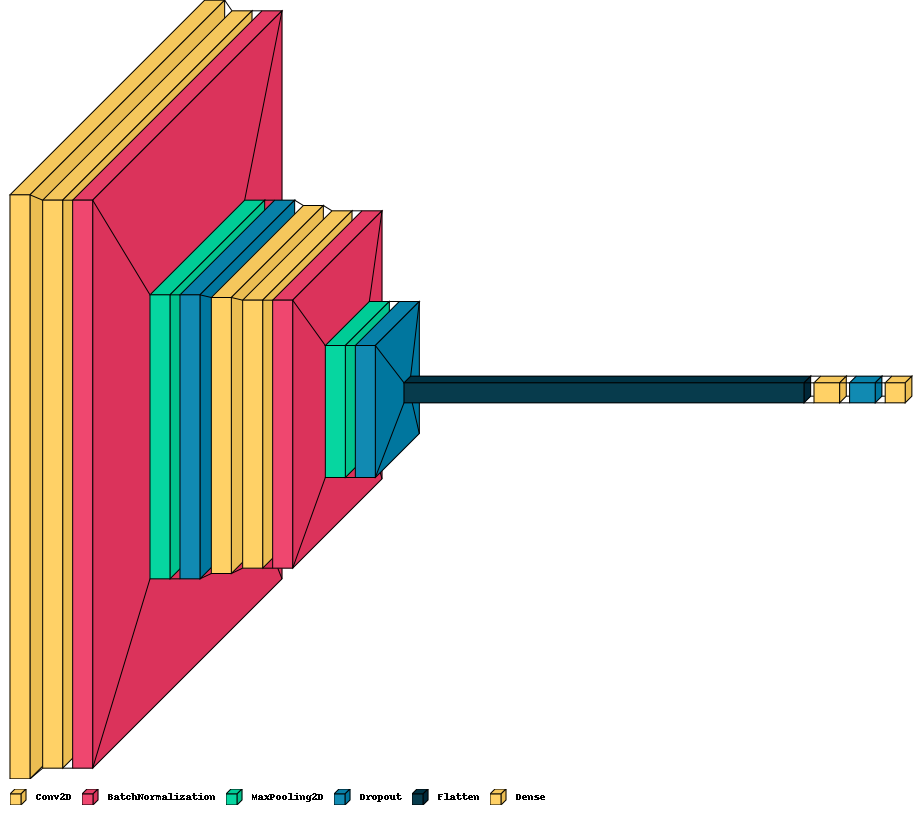

In [53]:
## Visualize the Layers
visualkeras.layered_view(model, legend=True)

In [27]:
learning_rate = 0.001
epochs=55
opt = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate, decay= learning_rate / (epochs * 0.5))
model.compile(optimizer = opt, loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

In [63]:
## Augmentation Function
aug = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.15,
    horizontal_flip=False,
    vertical_flip=False,
    fill_mode="nearest")

**Training The Model**

In [29]:
history = model.fit(aug.flow(X_train, y_train, batch_size=64), epochs=epochs, validation_data=(X_val, y_val))

Epoch 1/55
235/235 [==============================] - 112s 424ms/step - loss: 3.0815 - accuracy: 0.3185 - val_loss: 3.5001 - val_accuracy: 0.2063
Epoch 2/55
235/235 [==============================] - 99s 420ms/step - loss: 1.6293 - accuracy: 0.4868 - val_loss: 1.8787 - val_accuracy: 0.4423
Epoch 3/55
235/235 [==============================] - 97s 412ms/step - loss: 1.4111 - accuracy: 0.5483 - val_loss: 3.1568 - val_accuracy: 0.5197
Epoch 4/55
235/235 [==============================] - 98s 416ms/step - loss: 1.1349 - accuracy: 0.6337 - val_loss: 1.9887 - val_accuracy: 0.6060
Epoch 5/55
235/235 [==============================] - 97s 414ms/step - loss: 0.9893 - accuracy: 0.6846 - val_loss: 0.6855 - val_accuracy: 0.7910
Epoch 6/55
235/235 [==============================] - 99s 421ms/step - loss: 0.8926 - accuracy: 0.7170 - val_loss: 1.6655 - val_accuracy: 0.6863
Epoch 7/55
235/235 [==============================] - 99s 422ms/step - loss: 0.7649 - accuracy: 0.7532 - val_loss: 0.5921 - val_a

**Model Evaluation**

In [30]:
ModelLoss, ModelAccuracy = model.evaluate(X_test, y_test)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 2s 17ms/step - loss: 0.0969 - accuracy: 0.9820
Test Loss is 0.09694927930831909
Test Accuracy is 0.9819999933242798


In [42]:
drive.mount('/content/drive')

Mounted at /content/drive


In [58]:
## Saving The Model in Drive
model.save("/content/drive/MyDrive/CNN-Model/CnnModel.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


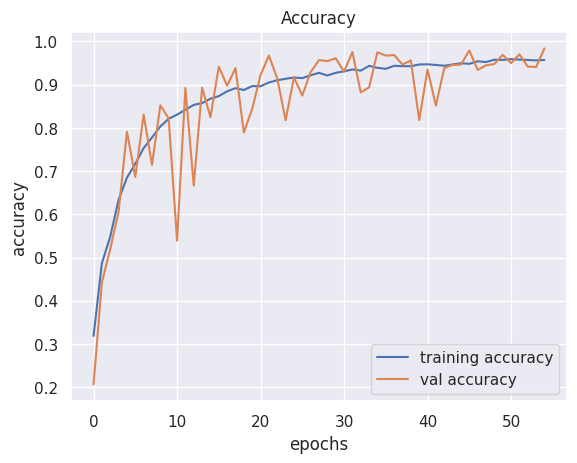

In [64]:
## Accuracy Curve
plt.figure(0)
plt.plot(history.history['accuracy'], label='training accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

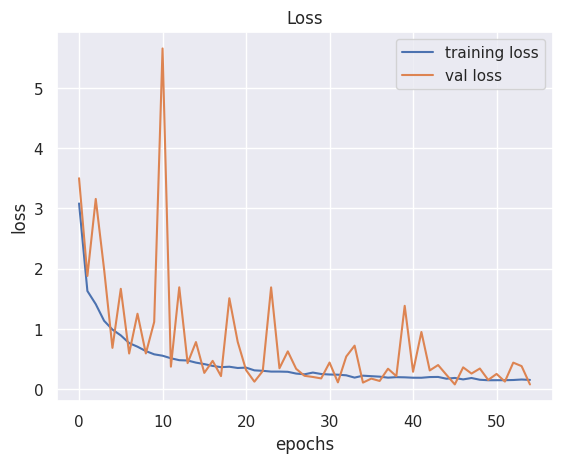

In [65]:
## Loss Curve
plt.figure(1)
plt.plot(history.history['loss'], label='training loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

94/94 [==============================] - 1s 15ms/step


<Axes: >

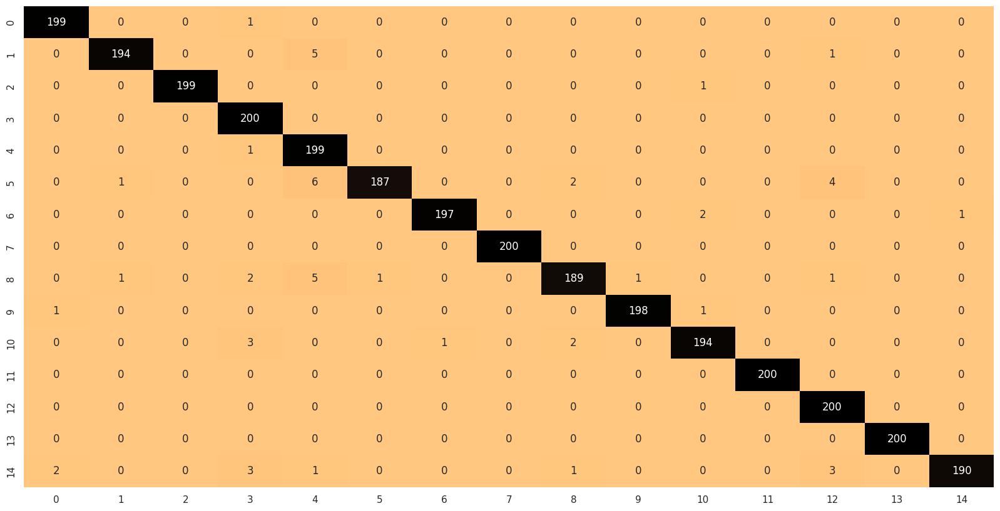

In [66]:
## Confusion Matrix
predictions = model.predict(X_test)
fig,ax=plt.subplots(figsize=(20,10))
cm = confusion_matrix(y_test, np.argmax(predictions, axis=1))
sns.heatmap(cm,annot=True,cmap="copper_r",fmt="d",cbar=False,ax=ax)

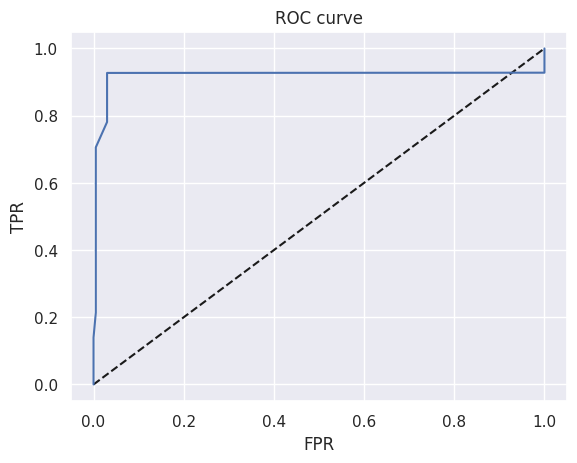

In [67]:
## ROC Curve
TPR, FPR, thresholds = roc_curve(y_test,np.argmax(predictions, axis=1),pos_label=1)
plt.plot([0,1],[0,1],'k--')
plt.plot(FPR,TPR, label='CNN')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [55]:
model = keras.models.load_model('CnnModel.h5')